In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
%matplotlib inline

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [231]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, prev):
        # was the line detected in the last iteration?
        self.detected = False
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #Recent fits
        self.recent_coeffs = []
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        if prev != None:
            self.recent_coeffs = prev.recent_coeffs
        
    def fit(self, lane_inds, nonzerox, nonzeroy, ploty):
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds]

        # Fit a second order polynomial to each
        try:
            fit = np.polyfit(self.ally, self.allx, 2)
            self.radius_of_curvature = self.calculate_radius_of_curvature(ploty)
        except:
            return
        #sanity checks
        if self.sanity_check():
            self.recent_coeffs.append(fit)
            if len(self.recent_coeffs) > 10:
                self.recent_coeffs.pop()
        elif len(self.recent_coeffs) > 0:
            fit = np.mean(np.array(self.recent_coeffs), axis = 0)
        else:
            return
        self.current_fit = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
        self.detected = True
        
    def calculate_radius_of_curvature(self, ploty):
        # Define conversions in x and y from pixels space to meters
        y_eval = np.max(ploty)
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension

        # Fit new polynomials to x,y in world space
        fit_cr = np.polyfit(self.ally*ym_per_pix, self.allx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        return ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    def sanity_check(self):
        return self.radius_of_curvature > 100
        

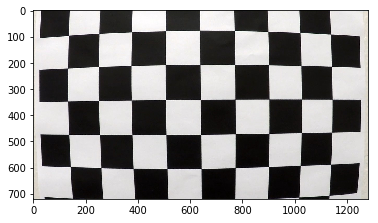

In [216]:
# Camera calibration
img = mpimg.imread('./camera_cal/calibration1.jpg')
plt.imshow(img)

In [76]:
nx, ny = 9, 6

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

In [77]:
def undistort(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return cv2.undistort(img, mtx, dist, None, mtx)

In [78]:
test_images = glob.glob('./test_images/*.jpg')
for fname in test_images:
    img = mpimg.imread(fname)
    img = undistort(img)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, img)

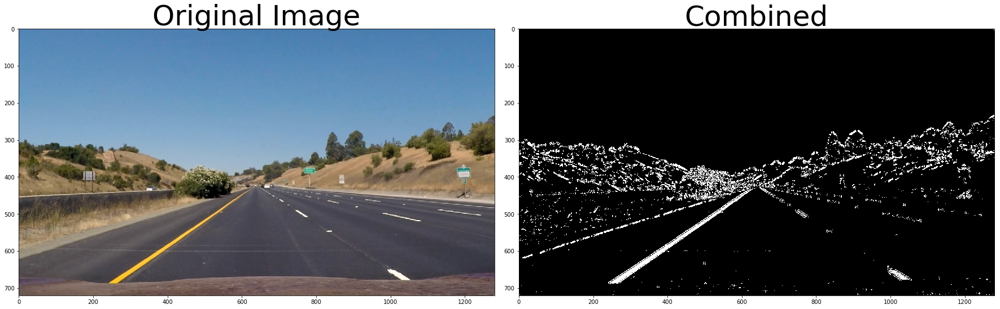

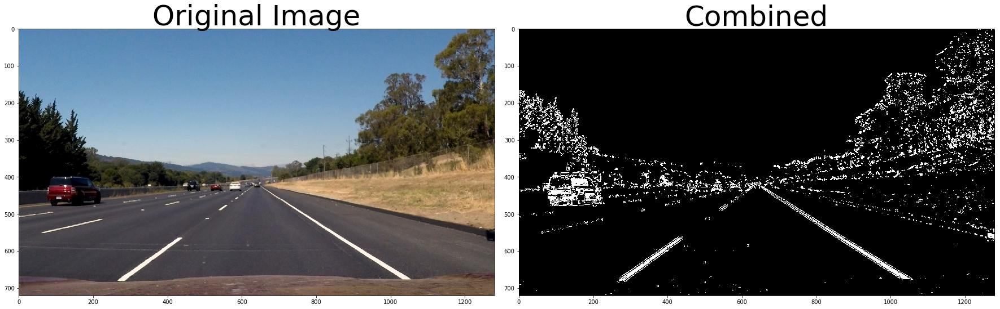

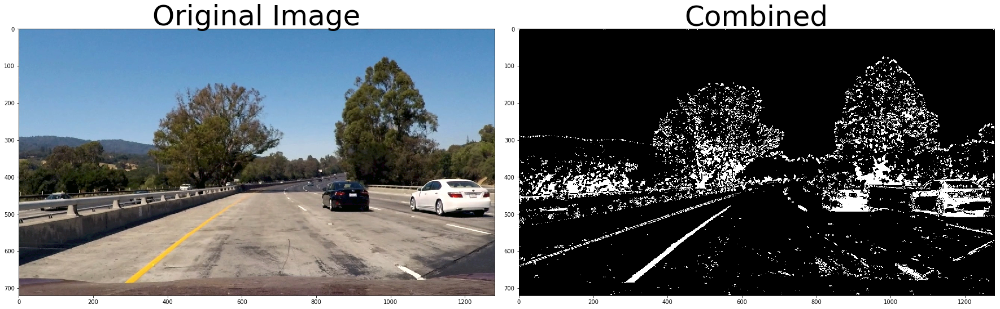

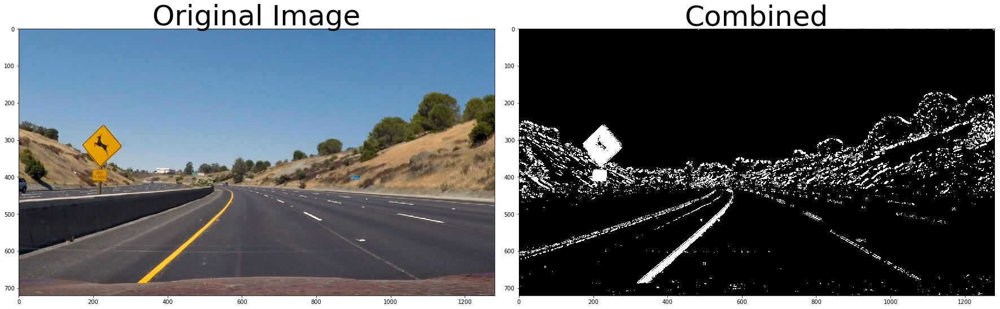

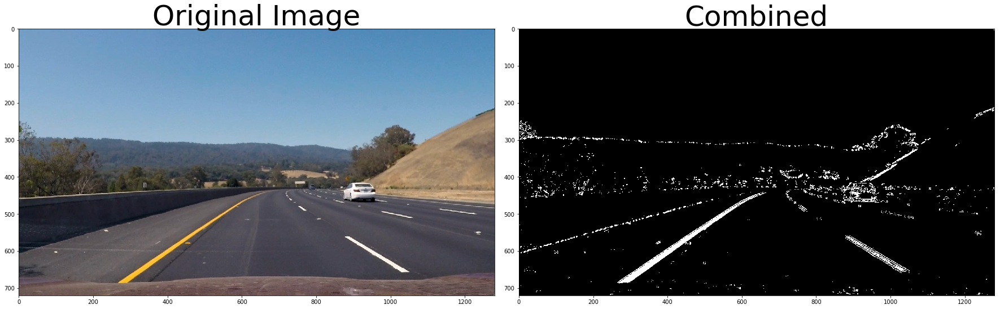

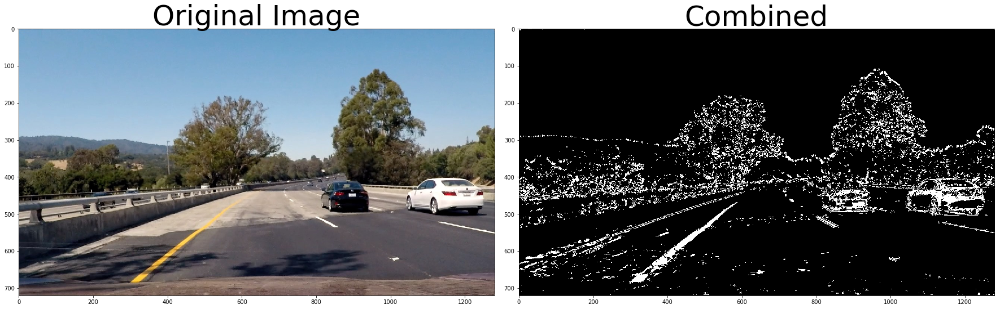

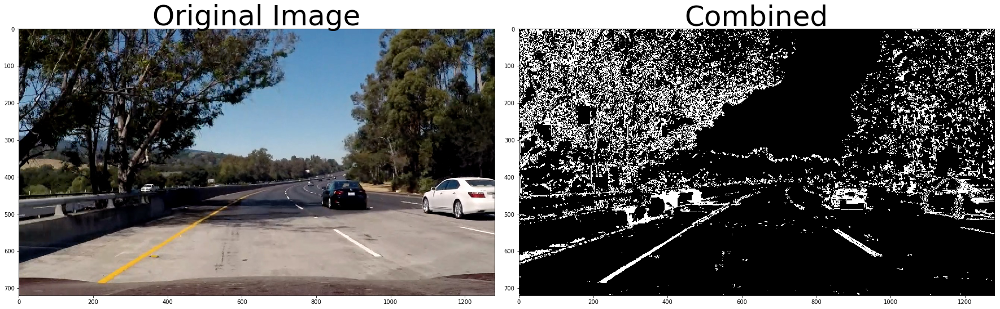

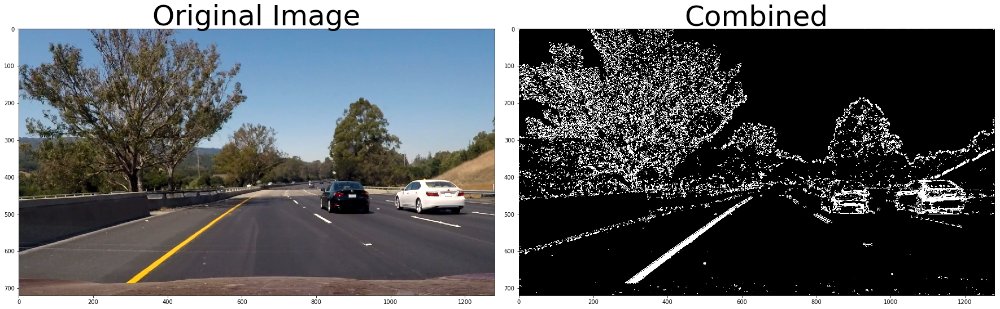

In [79]:
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    x, y = 1, 0
    if orient == 'y':
        x, y = 0, 1
    sobel = cv2.Sobel(gray, cv2.CV_64F, x, y)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(magnitude)/255.
    magnitude = (magnitude/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(magnitude)
    binary_output[(magnitude >= mag_thresh[0]) & (magnitude <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    direction = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output

def saturation_threshold(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

for fname in test_images:
    image = mpimg.imread(fname)
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
    sat_binary = saturation_threshold(image, thresh=(170, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) | (sat_binary == 1))] = 1
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(combined, cmap='gray')
    ax2.set_title('Combined', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, combined)

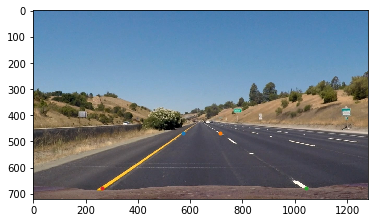

In [111]:
img = mpimg.imread('./test_images/straight_lines1.jpg')

plt.imshow(img)
plt.plot(572, 467, '.')
plt.plot(714, 467, '.')
plt.plot(1042, 677, '.')
plt.plot(264, 677, '.')

In [112]:
def warp(img, unwarp=False):
    img_size = (img.shape[1], img.shape[0])
    src = np.float32([
        [582, 467],
        [714, 467],
        [1120, 719],
        [280, 719]
    ])
    
    dst = np.float32([
        [280, 0],
        [1120, 0],
        [1120, 719],
        [280, 719]
    ])
    
    M = cv2.getPerspectiveTransform(dst, src) if unwarp else cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

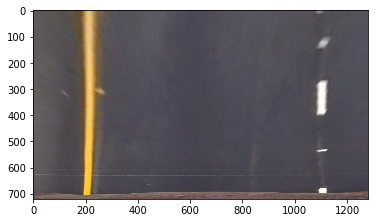

In [113]:
img = mpimg.imread('./test_images/straight_lines1.jpg')
img = warp(img)
plt.imshow(img)

In [98]:
# Putting it all together
def preprocess(img):
    undist = undistort(img)
    gradx = abs_sobel_thresh(undist, orient='x', thresh=(20, 100))
    grady = abs_sobel_thresh(undist, orient='y', thresh=(20, 100))
    mag_binary = mag_thresh(undist, sobel_kernel=9, mag_thresh=(30, 100))
    dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.3))
    sat_binary = saturation_threshold(undist, thresh=(170, 255))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1) | (sat_binary == 1))] = 1
    warped = warp(combined)
    return warped

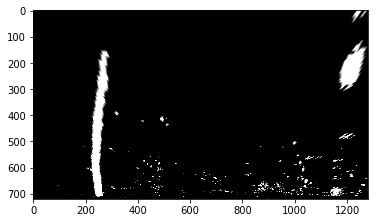

In [114]:
img = cv2.imread('./test_images/test1.jpg')
binary_warped = preprocess(img)

plt.imshow(binary_warped, cmap='gray')

In [183]:
current_left_line, current_right_line = None, None

In [218]:
def fit_lines_histogram(binary_warped):
    global current_left_line, current_right_line
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    left_line = Line(current_left_line)
    right_line = Line(current_right_line)
    
    left_line.fit(left_lane_inds, nonzerox, nonzeroy, ploty)
    right_line.fit(right_lane_inds, nonzerox, nonzeroy, ploty)
    
    current_left_line, current_right_line = left_line, right_line
    return left_line, right_line

In [219]:
def fit_lines(binary_warped):
    global current_left_line, current_right_line
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    if current_left_line == None or current_right_line == None:
        # Go back to the histogram method.
        return fit_lines_histogram(binary_warped)
    margin = 100
    left_fit = current_left_line.current_fit
    right_fit = current_right_line.current_fit
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    left_line = Line(current_left_line)
    right_line = Line(current_right_line)
    
    left_line.fit(left_lane_inds, nonzerox, nonzeroy, ploty)
    right_line.fit(right_lane_inds, nonzerox, nonzeroy, ploty)
    
    if not(left_line.detected or right_line.detected):
        return fit_lines_histogram(binary_warped)
    
    current_left_line, current_right_line = left_line, right_line
    return left_line, right_line

Left line curavature: 993m
Right line curavature: 2707m


(720, 0)

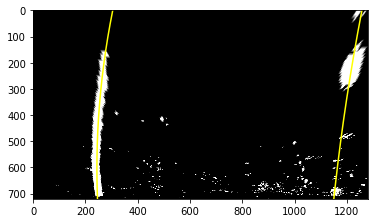

In [209]:
# Generate x and y values for plotting
img = cv2.imread('./test_images/test1.jpg')
binary_warped = preprocess(img)
left_line, right_line = fit_lines_histogram(binary_warped)
print ('Left line curavature: {0:.0f}m'.format(left_line.radius_of_curvature))
print ('Right line curavature: {0:.0f}m'.format(right_line.radius_of_curvature))

plt.imshow(binary_warped, cmap='gray')
plt.plot(left_line.current_fit, ploty, color='yellow')
plt.plot(right_line.current_fit, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [213]:
def process(img, test=False):
    binary_warped = preprocess(img)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    undist = undistort(img)
    
    if test:
        left_line, right_line = fit_lines_histogram(binary_warped)
    else:
        left_line, right_line = fit_lines(binary_warped)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = left_line.current_fit
    right_fitx = right_line.current_fit
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = warp(color_warp, True)
    # Combine the result with the original image
    return cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

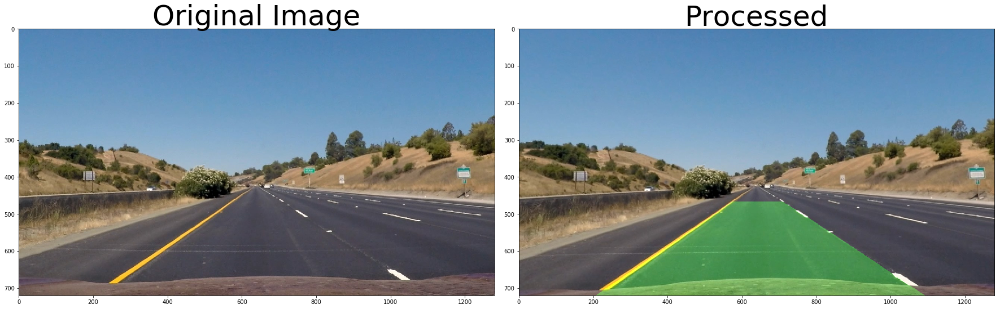

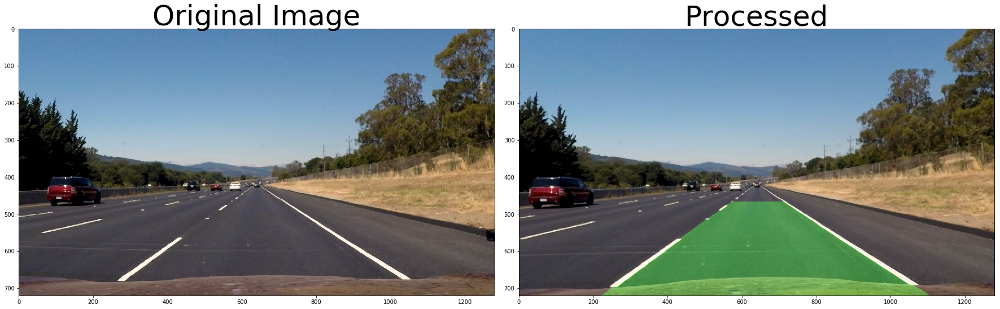

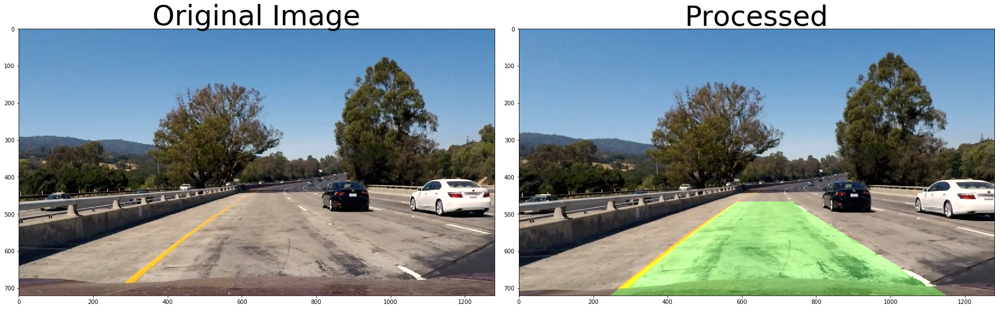

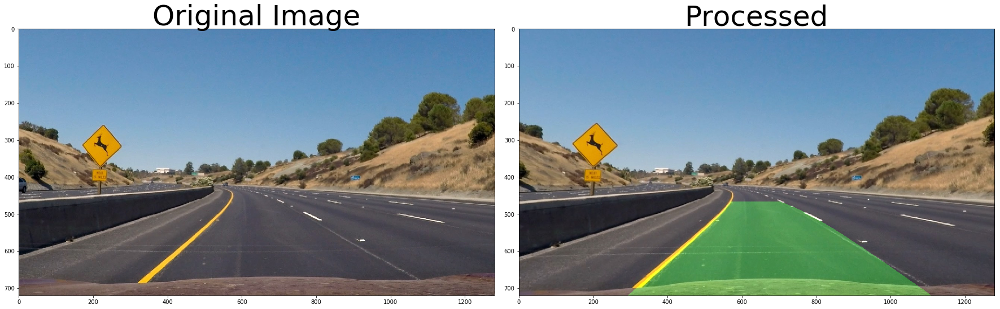

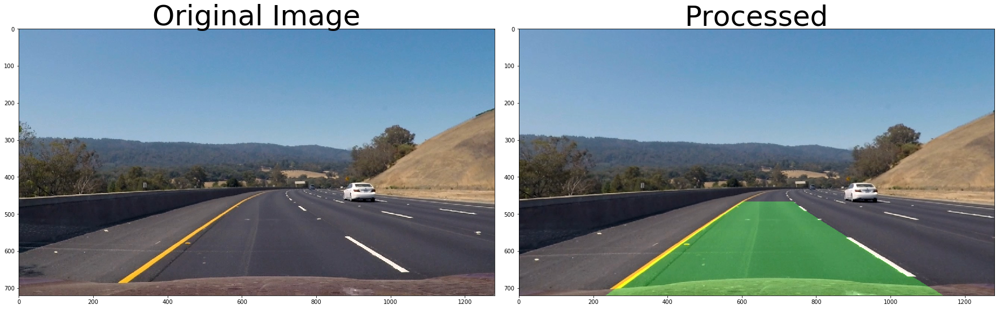

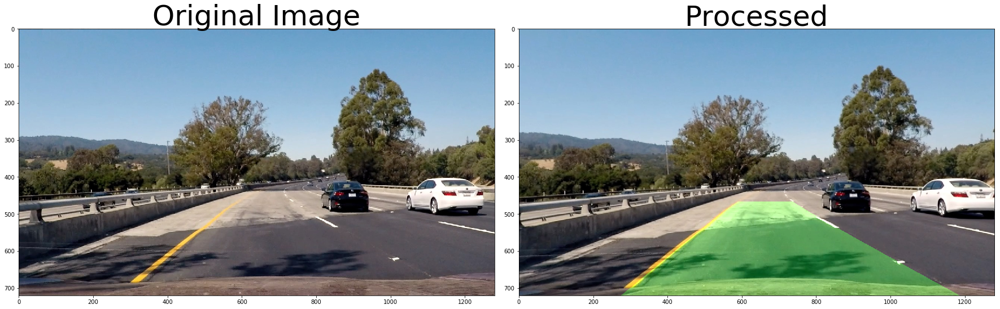

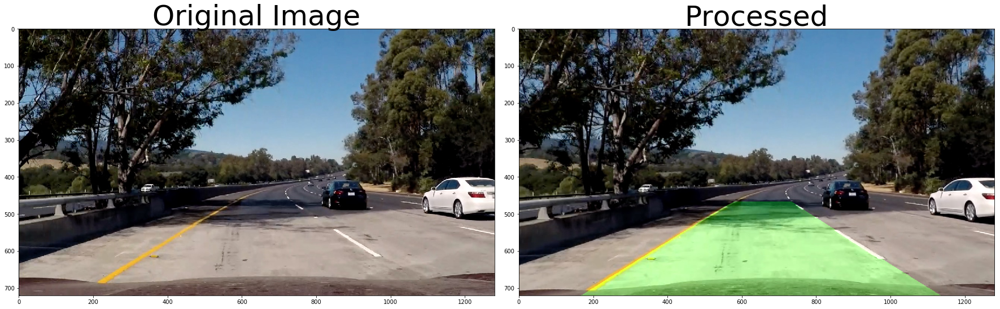

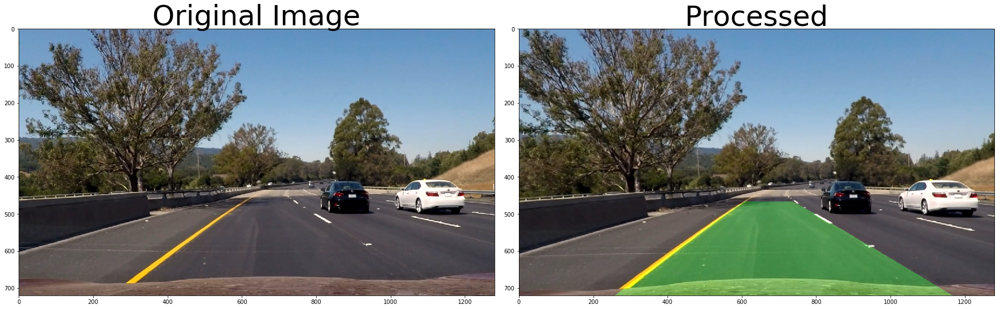

In [214]:
current_left_line, current_right_line = None, None
for fname in test_images:
    image = cv2.imread(fname)
    output = process(image, True)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(cv2.cvtColor(output, cv2.COLOR_RGB2BGR))
    ax2.set_title('Processed', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    output = fname.replace('test_images', 'output_images')
    mpimg.imsave(output, combined)

In [232]:
current_left_line, current_right_line = None, None
output_file = 'project_out.mp4'
clip1 = VideoFileClip("project_video.mp4")
output = clip1.fl_image(process) #NOTE: this function expects color images!!
%time output.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video project_out.mp4
[MoviePy] Writing video project_out.mp4




  0%|          | 0/1261 [00:00<?, ?it/s]

  0%|          | 1/1261 [00:02<57:10,  2.72s/it]

  0%|          | 2/1261 [00:05<58:08,  2.77s/it]

  0%|          | 3/1261 [00:08<57:10,  2.73s/it]

  0%|          | 4/1261 [00:10<56:38,  2.70s/it]

  0%|          | 5/1261 [00:13<56:14,  2.69s/it]

  0%|          | 6/1261 [00:16<55:51,  2.67s/it]

  1%|          | 7/1261 [00:18<55:57,  2.68s/it]

KeyboardInterrupt: 